In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import os

In [111]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib as mpl
mpl.rcParams['lines.linewidth'] = 3

# 1D Column Configuration for SalishSeaCast: C1D_SS

James Munroe <<jmunroe@earthdata.ca>>

This configuration is designed for exploring and tuning 1D column processes within SalishSeaCast.

## Bathymetry

In [7]:
bathy = xr.open_dataset('bathy_meter.nc')

We will focus on two specific locations in the Salish Sea as identified in the map above denoted as the "Shallow Basin" and the "Deep Basin".

These locations are 

In [221]:
y_deep = 500
x_deep = 240
print('Deep Basin:\n'
      f'  lat = {float(bathy.nav_lat[y_deep,x_deep]):.2f}\n'
      f'  lon = {float(bathy.nav_lon[y_deep,x_deep]):.2f}\n')

y_shallow = 638
x_shallow = 128
print('Shallow Basin:\n'
      f'  lat = {float(bathy.nav_lat[y_shallow,x_shallow]):.2f}\n'
      f'  lon = {float(bathy.nav_lon[y_shallow,x_shallow]):.2f}\n')

Deep Basin:
  lat = 49.29
  lon = -123.82

Shallow Basin:
  lat = 49.62
  lon = -124.86



These locations are set in the `namc1d` namelist:

```
!-----------------------------------------------------------------------
&namc1d        !   1D configuration options                             ("key_c1d")
!-----------------------------------------------------------------------
   rn_lat1d    =      49.29 !  Column latitude
   rn_lon1d    =    -123.82 !  Column longitude
   ln_c1d_locpt= .true.   ! Localization of 1D config in a grid (T) or independant point (F)
/
```

and the configuration automatically determines the x-y coordinate nearest to that latitude/longitude.

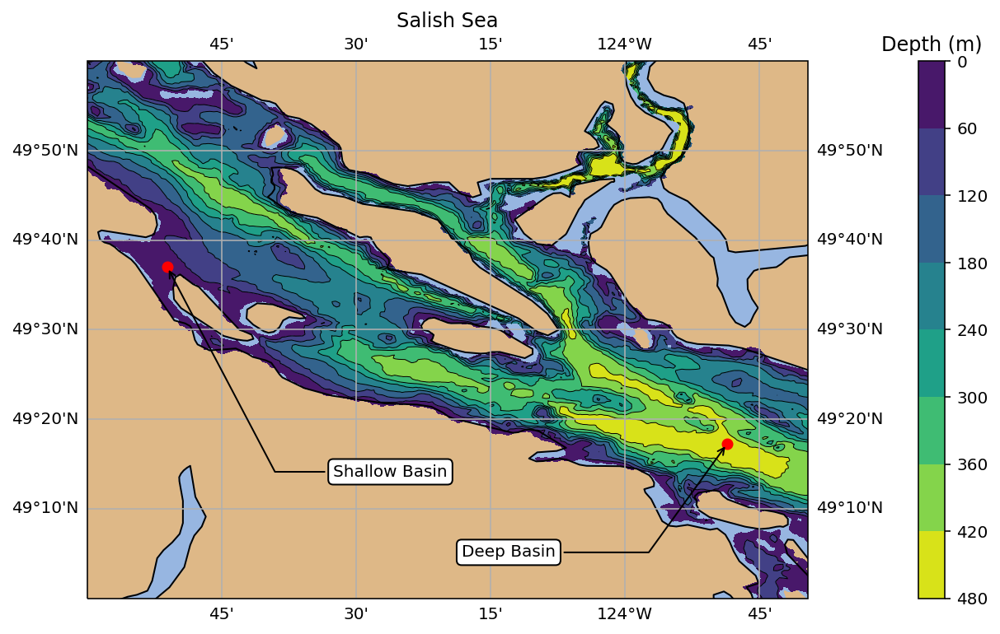

In [212]:
plt.figure(figsize=(12,6))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, color='#DEB887')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.set_extent([-125, -123.66, 49, 50], crs=ccrs.PlateCarree())
# The data are defined in lat/lon coordinate system, so PlateCarree()
# is the appropriate choice:
data_crs = ccrs.PlateCarree()

m = ax.contourf(bathy.nav_lon, bathy.nav_lat, bathy.Bathymetry, levels=8,transform=data_crs)
ax.contour(bathy.nav_lon, bathy.nav_lat, bathy.Bathymetry,  levels=8, linewidths=0.5, colors='k', transform=data_crs)

# Deep basin
y = y_deep
x = x_deep
ax.plot( bathy.nav_lon[y,x], bathy.nav_lat[y,x], 'ro', transform=data_crs)

ax.annotate('Deep Basin', 
            xy=(bathy.nav_lon[y,x], bathy.nav_lat[y,x]),  xycoords='data',
            xytext=(0.65, 0.1), textcoords='axes fraction',
            arrowprops=dict(arrowstyle='->',
                            connectionstyle='arc,angleA=0,armA=170'),
            bbox=dict(boxstyle='round', fc='w'),
            horizontalalignment='right', verticalalignment='top'
            )

# Shallow basin
y = y_shallow
x = x_shallow
ax.plot( bathy.nav_lon[y,x], bathy.nav_lat[y,x], 'ro', transform=data_crs)
ax.annotate('Shallow Basin', 
            xy=(bathy.nav_lon[y,x], bathy.nav_lat[y,x]),  xycoords='data',
            xytext=(0.5, 0.25), textcoords='axes fraction',
            arrowprops=dict(arrowstyle='->',
                            connectionstyle='arc,angleA=-180,armA=140'),
            bbox=dict(boxstyle='round', fc='w'),
            horizontalalignment='right', verticalalignment='top'
            )

plt.title('Salish Sea')
colorbar = plt.colorbar(m, location='right', pad=0.1, fraction=0.05)
colorbar.ax.set_title('Depth (m)')
colorbar.ax.invert_yaxis()
plt.show()

## Time period

To demonstrate this configuration, the focus is on a one week period in early February 2016:

In [251]:
dates_YYYYMMDD = [f'201602{d:02d}-201602{d:02d}' for d in range(1, 8)]
dates_yYYYYmMMdDD = [f'y2016m02d{d:02d}' for d in range(1, 8)]

print(f'Start date: {dates_yYYYYmMMdDD[0]}\n'
      f'End date: {dates_yYYYYmMMdDD[-1]}\n')

Start date: y2016m02d01
End date: y2016m02d07



## Surface Forcing

In [252]:
ds = xr.open_mfdataset([f'ATMDATA/ops_{datestr}.nc' for datestr in dates_yYYYYmMMdDD],
                      preprocess=lambda ds: ds.set_coords(['nav_lat', 'nav_lon']))
# convert longitudes from [0,360) to [-180, 180)
ds.nav_lon[:] = ds.nav_lon.where(ds.nav_lon>=180, 360) - 360 + ds.nav_lon.where(ds.nav_lon<180, 0)

In [253]:
@interact(t=(0, len(ds.time_counter)-1, 1))
def plot_winds(t=0):
    
    plt.figure(figsize=(12,6))
    ax = plt.axes(projection=ccrs.PlateCarree())

    #ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.1)
    ax.set_extent([-125, -123.66, 49, 50], crs=ccrs.PlateCarree())
    
    data_crs = ccrs.PlateCarree()

    ax.contour(bathy.nav_lon, bathy.nav_lat, bathy.Bathymetry,  levels=8, linewidths=0.5, colors='k', transform=data_crs)
    
    wind = ds.isel(time_counter=t)
    
    uv_mag = np.sqrt(wind.u_wind**2 + wind.v_wind**2)
    m = ax.contourf(wind.nav_lon, wind.nav_lat, 
                uv_mag, transform=data_crs, 
                levels = np.linspace(0, 20, 21))
    colorbar = plt.colorbar(m, location='right', 
                        pad=0.1, fraction=0.05)
    colorbar.ax.set_title('m/s')
    
    ax.quiver(wind.nav_lon[::3, ::3], wind.nav_lat[::3, ::3],  
              wind.u_wind[::3, ::3], wind.v_wind[::3, ::3], 
              pivot='mid', units='width', scale=100,
              color='#CCCCCC',
              transform=data_crs)

    def plot_loc(x, y):
        ax.plot( bathy.nav_lon[y,x], bathy.nav_lat[y,x], 'ro', transform=data_crs)
        # I want to find the speed at a certain lat/lon point.
        lat = bathy.nav_lat[y, x]
        lon = bathy.nav_lon[y, x]
        # First, find the index of the grid point nearest a specific lat/lon.   
        abslat = np.abs(ds.nav_lat-lat)
        abslon = np.abs(ds.nav_lon-lon)
        c = np.maximum(abslon, abslat)
        ([yloc], [xloc]) = np.where(c == np.min(c))
        ax.plot(ds.nav_lon[yloc, xloc], ds.nav_lat[yloc, xloc], 'wo', alpha=0.5,
                transform=data_crs)
    
    plot_loc(x_shallow, y_shallow)
    plot_loc(x_deep, y_deep)
    
    timestr = np.datetime_as_string(ds.time_counter[t], unit='h')
    plt.title('Surface Winds at '+ timestr)

interactive(children=(IntSlider(value=0, description='t', max=167), Output()), _dom_classes=('widget-interact'…

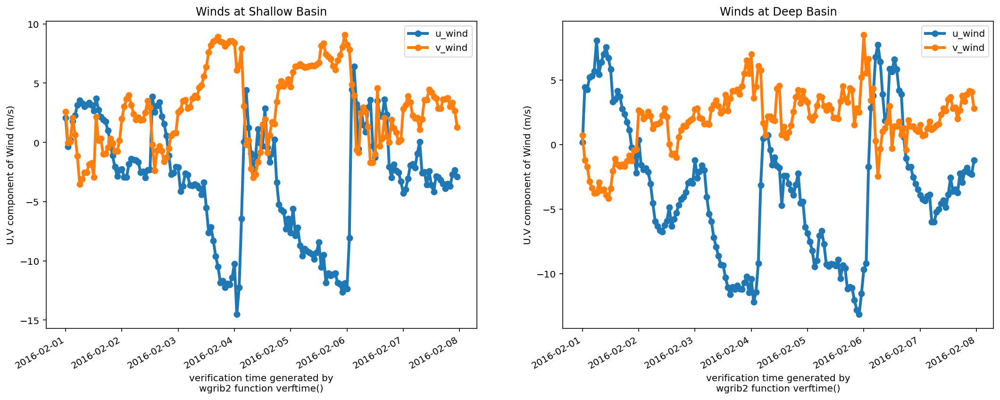

In [254]:
def plot_wind(x, y, ax):
    # I want to find the speed at a certain lat/lon point.
    lat = bathy.nav_lat[y, x]
    lon = bathy.nav_lon[y, x]

    # First, find the index of the grid point nearest a specific lat/lon.   
    abslat = np.abs(ds.nav_lat-lat)
    abslon = np.abs(ds.nav_lon-lon)
    c = np.maximum(abslon, abslat)
    ([yloc], [xloc]) = np.where(c == np.min(c))

    # Now I can use that index location to get the values at the x/y diminsion
    point_ds = ds.isel(x=xloc, y=yloc)

    point_ds.u_wind.plot(ax=ax, marker='o', label='u_wind')
    point_ds.v_wind.plot(ax=ax, marker='o', label='v_wind')
    ax.legend()
    ax.set_label('Date')
    ax.set_ylabel('U,V component of Wind (m/s)')
    
fig, axs = plt.subplots(1, 2, figsize=(18, 6))
plot_wind(x_shallow, y_shallow, ax=axs[0])
axs[0].set_title('Winds at Shallow Basin')
plot_wind(x_deep, y_deep, ax=axs[1])
axs[1].set_title('Winds at Deep Basin')
plt.show()

## Restoring Force

While the surface currents are allowed to respond dynamically to the surface forcing, all the other vertical level are set to Newtonian damped to follow the 3D model variables with a time scale of $\tau = 1$ hour.

## Load Currents

Load velocities from original 3D model.

In [255]:
ds = xr.open_mfdataset([f'source_model/SalishSeaCast-VNR002_1h_grid_U_{datestr}.nc' for datestr in dates_yYYYYmMMdDD])
u_3d_deep = ds.vozocrtx.isel(x=slice(x_deep-2,x_deep+3), y=slice(y_deep-2,y_deep+3)).compute()
u_3d_shallow = ds.vozocrtx.isel(x=slice(x_shallow-2,x_shallow+3), y=slice(y_shallow-2,y_shallow+3)).compute()

ds = xr.open_mfdataset([f'source_model/SalishSeaCast-VNR002_1h_grid_V_{datestr}.nc' for datestr in dates_yYYYYmMMdDD])
v_3d_deep = ds.vomecrty.isel(x=slice(x_deep-2,x_deep+3), y=slice(y_deep-2,y_deep+3)).compute()
v_3d_shallow = ds.vomecrty.isel(x=slice(x_shallow-2,x_shallow+3), y=slice(y_shallow-2,y_shallow+3)).compute()


Load velocities profiles from 1D column model

In [256]:
ds = xr.open_mfdataset([f'deep_basin/SalishSea_1h_grid_U_{datestr}.nc' for datestr in dates_YYYYMMDD])
u_1d_deep = ds.vozocrtx.isel(x=1, y=1).compute()
ds = xr.open_mfdataset([f'deep_basin/SalishSea_1h_grid_V_{datestr}.nc' for datestr in dates_YYYYMMDD])
v_1d_deep = ds.vomecrty.isel(x=1, y=1).compute()

ds = xr.open_mfdataset([f'shallow_basin/SalishSea_1h_grid_U_{datestr}.nc' for datestr in dates_YYYYMMDD])
u_1d_shallow = ds.vozocrtx.isel(x=1, y=1).compute()
ds = xr.open_mfdataset([f'shallow_basin/SalishSea_1h_grid_V_{datestr}.nc' for datestr in dates_YYYYMMDD])
v_1d_shallow = ds.vomecrty.isel(x=1, y=1).compute()

## Velocity profiles

In [257]:
@interact(t=(0, len(u_3d_deep.time_counter)-1, 1), basin=['deep', 'shallow'], offset_x=(-2, 2, 1), offset_y=(-2, 2, 1))
def plot_uv_profiles(t=0, basin='deep', offset_x=0, offset_y=0):
    if basin=='deep':
        us_3d = u_3d_deep.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        vs_3d = v_3d_deep.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        us_1d = u_1d_deep.isel(time_counter=t)
        vs_1d = v_1d_deep.isel(time_counter=t)
        ymin = 400
    else:
        us_3d = u_3d_shallow.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        vs_3d = v_3d_shallow.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        us_1d = u_1d_shallow.isel(time_counter=t)
        vs_1d = v_1d_shallow.isel(time_counter=t)
        ymin = 20
        
  
    fig, axs = plt.subplots(1, 2, figsize=(12, 8))
  
    timestr = np.datetime_as_string(us_3d.time_counter, unit='h')
    
    timestr = np.datetime_as_string(us_3d.time_counter, unit='h')

    us_3d.plot(y='depthu', label='u 3D', marker='o', ax=axs[0])
    us_1d.plot(y='depthu', label='u 1D', marker='o', ax=axs[0])
    axs[0].set_ylim(ymin, 0)
    axs[0].set_xlim(-0.2, 0.2)
    axs[0].set_title(f'3D model at {timestr}')
    axs[0].legend()
    
    vs_3d.plot(y='depthv', label='v 3D', marker='o', ax=axs[1])
    vs_1d.plot(y='depthv', label='v 1D', marker='o', ax=axs[1])
    
    axs[1].set_ylim(ymin, 0)
    axs[1].set_xlim(-0.2, 0.2)
    axs[1].legend()
    axs[1].set_title(f'1D model at {timestr}')
    
    axs[1].set_title(f'1D model at {timestr}')
    #axs[1].set_xlabel('ocean current [m/s]')

interactive(children=(IntSlider(value=0, description='t', max=167), Dropdown(description='basin', options=('de…

### Velocity at fixed vertical depths

In [258]:
@interact(z=(0, len(u_3d_deep.depthu)-1, 1), basin=['deep', 'shallow'], offset_x=(-2, 2, 1), offset_y=(-2, 2, 1))
def plot_uv_depth(z=0, basin='deep', offset_x=0, offset_y=0):
    
    if basin=='deep':
        us_3d = u_3d_deep.isel(depthu=z, x=offset_x+2, y=offset_y+2)
        vs_3d = v_3d_deep.isel(depthv=z, x=offset_x+2, y=offset_y+2)
        us_1d = u_1d_deep.isel(depthu=z)
        vs_1d = v_1d_deep.isel(depthv=z)
    else:
        us_3d = u_3d_shallow.isel(depthu=z, x=offset_x+2, y=offset_y+2)
        vs_3d = v_3d_shallow.isel(depthv=z, x=offset_x+2, y=offset_y+2)
        us_1d = u_1d_shallow.isel(depthu=z)
        vs_1d = v_1d_shallow.isel(depthv=z)
        
    depthstr = us_3d.depthu.values
    
    fig, axs = plt.subplots(2, 1, figsize=(18, 7))
  
    us_3d.plot(x='time_counter', label='u_3d', marker='o', ax=axs[0])
    us_1d.plot(x='time_counter', label='u_1d', marker='o', ax=axs[0])
    axs[0].legend()
    axs[0].set_title(f'Velocity at z={depthstr:.2f} m')
    
    vs_3d.plot(x='time_counter', label='v_3d', marker='o', ax=axs[1])
    vs_1d.plot(x='time_counter', label='v_1d', marker='o', ax=axs[1])
    axs[1].legend()
    axs[1].set_title("")

interactive(children=(IntSlider(value=0, description='z', max=39), Dropdown(description='basin', options=('dee…

## Temperature/Salinity Profiles

Temperature and Salinity in the 1D model are also restored to the 3D model on a time scale of $\tau = 1$ hour.

Load T/S data from 1D model

In [259]:
ds = xr.open_mfdataset([f'deep_basin/SalishSea_1h_grid_T_{datestr}.nc' for datestr in dates_YYYYMMDD])
t_1d_deep = ds.votemper.isel(x=1, y=1).compute()
s_1d_deep = ds.vosaline.isel(x=1, y=1).compute()

ds = xr.open_mfdataset([f'shallow_basin/SalishSea_1h_grid_T_{datestr}.nc' for datestr in dates_YYYYMMDD])
t_1d_shallow = ds.votemper.isel(x=1, y=1).compute()
s_1d_shallow = ds.vosaline.isel(x=1, y=1).compute()

Load T/S data from 3D model

In [260]:
ds = xr.open_mfdataset([f'source_model/SalishSeaCast-VNR002_1h_grid_T_{datestr}.nc' for datestr in dates_yYYYYmMMdDD])

t_3d_deep = ds.votemper.isel(x=slice(x_deep-2,x_deep+3), y=slice(y_deep-2,y_deep+3)).compute()
s_3d_deep = ds.vosaline.isel(x=slice(x_deep-2,x_deep+3), y=slice(y_deep-2,y_deep+3)).compute()
t_3d_shallow = ds.votemper.isel(x=slice(x_shallow-2,x_shallow+3), y=slice(y_shallow-2,y_shallow+3)).compute()
s_3d_shallow = ds.vosaline.isel(x=slice(x_shallow-2,x_shallow+3), y=slice(y_shallow-2,y_shallow+3)).compute()

In [266]:
@interact(t=(0, len(t_3d_deep.time_counter)-1, 1), basin=['deep', 'shallow'], offset_x=(-2, 2, 1), offset_y=(-2, 2, 1))
def plot_ts_profiles(t=0, basin='deep', offset_x=0, offset_y=0):
    if basin=='deep':
        ts_3d = t_3d_deep.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        ss_3d = s_3d_deep.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        ts_1d = t_1d_deep.isel(time_counter=t)
        ss_1d = s_1d_deep.isel(time_counter=t)
        ymin = 400
    else:
        ts_3d = t_3d_shallow.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        ss_3d = s_3d_shallow.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        ts_1d = t_1d_shallow.isel(time_counter=t)
        ss_1d = s_1d_shallow.isel(time_counter=t)
        ymin = 20
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 8))
      
    ts_3d.plot(y='deptht', label='T 3D', marker='o', ax=axs[0])
    ts_1d.plot(y='deptht', label='T 1D', marker='o', ax=axs[0])
    
    ss_3d.plot(y='deptht', label='S 3D', marker='o', ax=axs[1])
    ss_1d.plot(y='deptht', label='S 1D', marker='o', ax=axs[1])
    
    timestr = np.datetime_as_string(ts_3d.time_counter, unit='h')
    
    axs[0].set_ylim(ymin, 0)
    axs[0].set_xlim(6, 12)
    axs[0].set_title(f'Temperature at {timestr}')
    axs[0].legend()
    
    axs[1].set_ylim(ymin, 0)
    axs[1].set_xlim(22, 33)
    axs[1].set_title(f'Salinity at {timestr}')
    axs[1].legend()
    

interactive(children=(IntSlider(value=0, description='t', max=167), Dropdown(description='basin', options=('de…

## Silicates

The silicates (Silicon, Biogenic Silicon, and Diatoms) are *not* restored the the 3d model values.

Load from 1D model

In [262]:
ds = xr.open_mfdataset([f'deep_basin/SalishSea_1h_ptrc_T_{datestr}.nc' for datestr in dates_YYYYMMDD])
silicon_1d_deep = ds.silicon.isel(x=1, y=1).compute()
biogenic_silicon_1d_deep = ds.biogenic_silicon.isel(x=1, y=1).compute()
diatoms_1d_deep = ds.diatoms.isel(x=1, y=1).compute()

ds = xr.open_mfdataset([f'shallow_basin/SalishSea_1h_ptrc_T_{datestr}.nc' for datestr in dates_YYYYMMDD])
silicon_1d_shallow = ds.silicon.isel(x=1, y=1).compute()
biogenic_silicon_1d_shallow = ds.biogenic_silicon.isel(x=1, y=1).compute()
diatoms_1d_shallow = ds.diatoms.isel(x=1, y=1).compute()

Load from 3D model

In [263]:
ds = xr.open_mfdataset([f'source_model/SalishSeaCast-VNR002_1h_ptrc_T_{datestr}.nc' for datestr in dates_yYYYYmMMdDD[:3]])
silicon_3d_deep = ds.silicon.isel(x=slice(x_deep-2,x_deep+3), y=slice(y_deep-2,y_deep+3)).compute()
biogenic_silicon_3d_deep = ds.biogenic_silicon.isel(x=slice(x_deep-2,x_deep+3), y=slice(y_deep-2,y_deep+3)).compute()
diatoms_3d_deep = ds.diatoms.isel(x=slice(x_deep-2,x_deep+3), y=slice(y_deep-2,y_deep+3)).compute()

In [264]:
silicon_3d_shallow = ds.silicon.isel(x=slice(x_shallow-2,x_shallow+3), y=slice(y_shallow-2,y_shallow+3)).compute()
biogenic_silicon_3d_shallow = ds.biogenic_silicon.isel(x=slice(x_shallow-2,x_shallow+3), y=slice(y_shallow-2,y_shallow+3)).compute()
diatoms_3d_shallow = ds.diatoms.isel(x=slice(x_shallow-2,x_shallow+3), y=slice(y_shallow-2,y_shallow+3)).compute()

In [265]:
@interact(t=(0, len(silicon_1d_deep.time_counter)-1, 1), basin=['deep', 'shallow'], offset_x=(-2, 2, 1), offset_y=(-2, 2, 1))
def plot_silicates(t=0, basin='deep', offset_x=0, offset_y=0):
    if basin=='deep':
        silicons_3d = silicon_3d_deep.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        silicons_1d = silicon_1d_deep.isel(time_counter=t)
        biogenic_silicons_3d = biogenic_silicon_3d_deep.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        biogenic_silicons_1d = biogenic_silicon_1d_deep.isel(time_counter=t)
        diatomss_3d = diatoms_3d_deep.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        diatomss_1d = diatoms_1d_deep.isel(time_counter=t)
        
        ymin = 400
    else:
        silicons_3d = silicon_3d_shallow.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        silicons_1d = silicon_1d_shallow.isel(time_counter=t)
        biogenic_silicons_3d = biogenic_silicon_3d_shallow.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        biogenic_silicons_1d = biogenic_silicon_1d_shallow.isel(time_counter=t)
        diatomss_3d = diatoms_3d_shallow.isel(time_counter=t, x=offset_x+2, y=offset_y+2)
        diatomss_1d = diatoms_1d_shallow.isel(time_counter=t)
        
        ymin = 20
      
    
    timestr = np.datetime_as_string(silicons_1d.time_counter, unit='h')
    
    fig, axs = plt.subplots(1, 3, figsize=(18, 8))
      
    silicons_3d.plot(y='deptht', label='3D',  marker='o', ax=axs[0])
    silicons_1d.plot(y='deptht', label='1D',  marker='o', ax=axs[0])
    axs[0].set_ylim(ymin, 0)
    axs[0].set_xlim(40, 70)
    axs[0].set_title(f'Silicon at {timestr}')
    axs[0].legend()
    
    biogenic_silicons_3d.plot(y='deptht', label='3D', marker='o', ax=axs[1])
    biogenic_silicons_1d.plot(y='deptht', label='1D', marker='o', ax=axs[1])
    axs[1].set_ylim(ymin, 0)
    axs[1].set_xlim(-0.05, 0.85)
    axs[1].set_title(f'Biogenic Silicon at {timestr}')
    axs[1].legend()

    diatomss_3d.plot(y='deptht', label='3D', marker='o', ax=axs[2])
    diatomss_1d.plot(y='deptht', label='1D', marker='o', ax=axs[2])
    axs[2].set_ylim(ymin, 0)
    axs[2].set_xlim(-0.05, 0.85)
    axs[2].set_title(f'Diatoms at {timestr}')
    axs[2].legend()



interactive(children=(IntSlider(value=0, description='t', max=167), Dropdown(description='basin', options=('de…